## Relationship between LSTE and ESI and Wildfire Burn Probability

To examine the capability for ECOSTRESS data to understand drought conditions and wildfire risk in Rocky Mountain National Park (RMNP), we will use our LST and ESI data to look at how surface temperatures are related to vegetation drought stress leading up to the extreme wildfires in 2020 on the Front Range.

#### Step 1. Setup the notebook

As before, we need to import the required Python packages and define some environment variables (coordinate systems, file paths). 

In [201]:
import os, glob
import pandas as pd
import numpy as np
import geopandas as gpd
import rioxarray as rxr
import xarray as xr
import rasterio as rio
import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

from branca.element import Figure

# Projection information
geog = 'EPSG:4326'  # Geographic projection
prj = 'EPSG:5070'  # Projected coordinate system- WGS 84 NAD83 UTM Zone 13N

dest = '/home/jovyan/HYR-SENSE/data/Drought-FireRisk/'

#### Step 2. Read in the data

Now we can read in our ECOSTRESS LST and ESI data from the previous notebook

In [202]:
ecodir = '/home/jovyan/HYR-SENSE/data/Drought-FireRisk/georeferenced'

def list_files(path, ext, recursive):
    """
    List files of a specific type in a directory or subdirectories
    """
    if recursive is True:
        return glob.glob(os.path.join(path, '**', '*{}'.format(ext)), recursive=True)
    else:
        return glob.glob(os.path.join(path, '*{}'.format(ext)), recursive=False)

# Get a list of .nc files
tif_files = list_files(ecodir,"*.tif",recursive=True)
print(tif_files)

['/home/jovyan/HYR-SENSE/data/Drought-FireRisk/georeferenced/ECO4ESIPTJPL/ECOSTRESS_L4_ESI_PT-JPL_11158_004_20200624T121534_0601_01.tif', '/home/jovyan/HYR-SENSE/data/Drought-FireRisk/georeferenced/ECO4ESIPTJPL/ECOSTRESS_L4_ESI_PT-JPL_11406_009_20200710T122818_0601_01.tif', '/home/jovyan/HYR-SENSE/data/Drought-FireRisk/georeferenced/ECO2LSTE/ECOSTRESS_L2_LSTE_11158_004_20200624T121534_0601_01.tif', '/home/jovyan/HYR-SENSE/data/Drought-FireRisk/georeferenced/ECO2LSTE/ECOSTRESS_L2_LSTE_11406_009_20200710T122818_0601_01.tif']


In [203]:
### Load our ROI
roi = gpd.read_file(os.path.join(dest, 'NPS_ROMO_Boundary.geojson'))
roi = roi.to_crs("EPSG:4326") # projected CRS
bounds = roi.total_bounds  # Get the bounding box in the format (minx, miny, maxx, maxy)

Now we have our ROI and the extent. We can use this spatial data to crop our ECOSTRESS images and store these in a list.

In [204]:
### Now, read in the raster data and clip to our ROI
## Careful to manage the memory usage here because the original TIF files can be large before clipping

## Open one of the TIFF files to use as a reference
match = rxr.open_rasterio(tif_files[0], masked=True).squeeze()
# match_crop = match.rio.clip_box(*bounds)
match_crop = match.rio.clip(roi.geometry)
del match

# Now open and crop the ECOSTRESS granules
eco_da = []
for fp in tif_files:
    # Load the raster dataset
    da = rxr.open_rasterio(fp, mask=True).squeeze()
    # Crop to the bounds
    crop = da.rio.clip_box(*bounds)
    # Match the grid to our reference grid
    crop_repr = crop.rio.reproject_match(match_crop)
    
    eco_da.append(crop_repr)
    
    del da, crop

del match_crop
    
print(eco_da[0])

<xarray.DataArray (y: 628, x: 666)>
array([[1.        , 1.        , 1.        , ..., 0.75618947, 0.7520468 ,
        0.7512577 ],
       [1.        , 1.        , 1.        , ..., 0.75444347, 0.75444347,
        0.7512577 ],
       [1.        , 1.        , 1.        , ..., 0.753868  , 0.74843997,
        0.74843997],
       ...,
       [0.8346825 , 0.83812135, 0.8464009 , ..., 0.7892824 , 0.7890354 ,
        0.7871577 ],
       [0.84907943, 0.83812135, 0.8591245 , ..., 0.7867906 , 0.78750956,
        0.78750956],
       [0.8493454 , 0.8493454 , 0.8591245 , ..., 0.7881115 , 0.7855906 ,
        0.78723377]], dtype=float32)
Coordinates:
    band         int64 1
    spatial_ref  int64 0
  * x            (x) float64 -105.9 -105.9 -105.9 ... -105.5 -105.5 -105.5
  * y            (y) float64 40.55 40.55 40.55 40.55 ... 40.16 40.16 40.16 40.16
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    _FillValue:     3.402823466e+38


We can see by printing one of the raster datasets that they are read in an Xarray DataArray with spatial information. Now that we have our raster images loaded and cropped to the extent of our ROI, we can start to visualize and analyze the data.

### Examine LST and ESI

Let's start by creating some maps of our LST and ESI data products cropped to our region of interest. The code below identifies the minimum and maximum values to help with scaling our plots. Then, we use the 'hvplot' package to plot interactive maps.

In [206]:
# Let's grab the min and max LST values
min_lst = eco_da[0].min().item()
max_lst = eco_da[0].max().item()
print(f"Min LST: {min_lst}; Max LST: {max_lst}")

min_esi = eco_da[3].min().item()
max_esi = eco_da[3].max().item()
print(f"Min ESI: {min_esi}; Max ESI: {max_esi}")

Min LST: 0.46142855286598206; Max LST: 1.0
Min ESI: 266.6; Max ESI: 288.98


Now let's take a look at our two LST dates in an interactive map.

In [210]:
eco_da[2].hvplot.image(
    cmap='viridis', geo=True, tiles='ESRI', 
    aspect = 'equal', frame_width=300, 
    clim=(268,292)).opts(title="LST 06-24-2020") + \
eco_da[3].hvplot.image(
    cmap='viridis', geo=True, tiles='ESRI', 
    aspect = 'equal', frame_width=300, 
    clim=(268,292)).opts(title="LST 07-10-2020")

:Layout
   .Overlay.I  :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [x,y]   (value)
   .Overlay.II :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [x,y]   (value)

In [212]:
eco_da[0].hvplot.image(
    cmap='viridis', geo=True, tiles='ESRI', 
    aspect = 'equal', frame_width=300, 
    clim=(0.4,1)).opts(title="ESI 06-24-2020") + \
eco_da[1].hvplot.image(
    cmap='viridis', geo=True, tiles='ESRI', 
    aspect = 'equal', frame_width=300, 
    clim=(0.5157,1)).opts(title="ESI 07-10-2020")

:Layout
   .Overlay.I  :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [x,y]   (value)
   .Overlay.II :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [x,y]   (value)

#### Step 3. Create a raster data stack

Now we want to create a data stack with our raster inputs. 

In [219]:
### Create an array with our three image dates
arrays = [
    # June 24 
    np.array(eco_da[2]), np.array(eco_da[3]), 
    # July 10
    np.array(eco_da[0]), np.array(eco_da[1])
]

### Now convert our stack of data arrays to a data frame
## This gives us a dataframe of every pixel in our data stack

stack = pd.DataFrame(
    # concatenate column vectors
    np.hstack([
        # first flatten, then convert row vectors to columns
        ar.ravel().reshape(-1, 1)
        # for each array in your list
        for ar in arrays
    ])
)

stack = stack.dropna().reset_index(drop=True)  # drop any null rows

# Rename some of the data columns
stack = stack.rename(
    columns={
        0: 'LST_June24', 
        1: 'LST_July10', 
        2: 'ESI_June24',
        3: 'ESI_July10'
    })

# Convert to float if the values are not already numeric
stack = stack.apply(pd.to_numeric)
stack.head()

,LST_June24,LST_July10,ESI_June24,ESI_July10
0,275.70,275.14,1.0,0.707880
1,275.70,275.14,1.0,0.707880
2,277.12,275.40,1.0,0.718894
3,277.12,275.88,1.0,0.723145
4,277.26,275.88,1.0,0.723145


#### Step 4. Test the relationship between LST and ESI

In the sections below, we will test if there is a relationship between LST and ESI within our study area. To do this, we will create a scatter plot of the pixel values for the entire study region and then again across major land cover types.

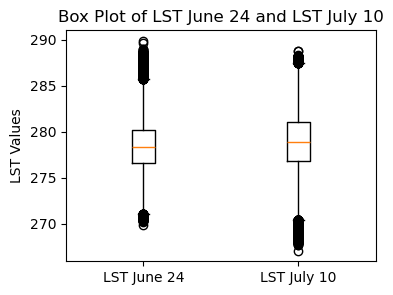

Mean LST June 24: 278.3847484953722;
Mean LST July 10: 278.87196442321283


In [217]:
# Create a box plot
plt.figure(figsize=(4, 3))
plt.boxplot([stack['LST_June24'], stack['LST_July10']], labels=['LST June 24', 'LST July 10'])

# Add title and labels
plt.title('Box Plot of LST June 24 and LST July 10')
plt.ylabel('LST Values')

# Show the plot
plt.show()

print(f"Mean LST June 24: {stack['LST_June24'].mean()};\nMean LST July 10: {stack['LST_July10'].mean()}")

Well, at least across our entire there is not a major difference (slight increase in mean LST in the July date). This is not much of a surprise when we are testing this by taking a mean over such a large area. Later in the notebook, we will look at the differences among different landcover / fuel types.

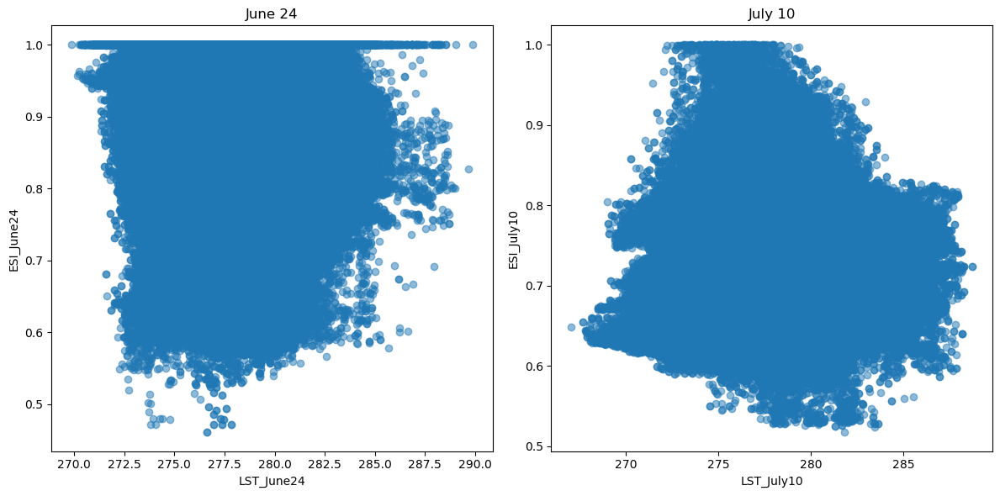

In [220]:
### Plotting with Matplotlib
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=False, sharey=False)

# June scatter plot
axes[0].scatter(stack['LST_June24'], stack['ESI_June24'], alpha=0.5)
axes[0].set_title('June 24')
axes[0].set_xlabel('LST_June24')
axes[0].set_ylabel('ESI_June24')

# July scatter plot
axes[1].scatter(stack['LST_July10'], stack['ESI_July10'], alpha=0.5)
axes[1].set_title('July 10')
axes[1].set_xlabel('LST_July10')
axes[1].set_ylabel('ESI_July10')

plt.tight_layout()
plt.show()

Well, at least for our example data it does not look like there is a clear relationship between LST and ESI pixels. Let's test if there is any noticeable difference in surface temperature and/or ESI across fuel types. 

### How does LST and ESI vary by major land cover type?

Although we did not see a relationship between LST and ESI, it may be helpful to look at how these measurements vary by landcover type. This can help us get closer towards understanding how LST and ESI relate to vegetation (fuel) conditions. 

To do this, we will load a sample dataset from the LANDFIRE Existing Vegetation Type (EVT) [https://landfire.gov/vegetation/evt] which we have pre-downloaded in the data store. This data is based on Landsat imagery with a 30-m spatial resolution. In order to make a quick comparison with our ECOSTRESS data, we will first resample the LANDFIRE data to the 70-meter spatial resolution of ECOSTRESS. Of course, this is making some assumptions that we may want to be careful about in formal analysis.

In [221]:
### Load LANDFIRE data for our study region
lf_path = os.path.join(dest,'LANDFIRE_ROMO_ca2016_EVT.tif')
landfire = rxr.open_rasterio(lf_path, mask=True).squeeze()
landfire = landfire.rio.reproject("EPSG:4326")
print(landfire)

<xarray.DataArray (y: 1509, x: 1736)>
array([[-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       ...,
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768]], dtype=int16)
Coordinates:
  * x            (x) float64 -106.0 -106.0 -106.0 ... -105.4 -105.4 -105.4
  * y            (y) float64 40.59 40.59 40.59 40.59 ... 40.12 40.12 40.12 40.12
    band         int64 1
    spatial_ref  int64 0
Attributes:
    DataType:            Generic
    AREA_OR_POINT:       Area
    RepresentationType:  THEMATIC
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          -32768


In [222]:
### Resample to match the ECOSTRESS data
transform = eco_da[0].rio.transform()
height, width = eco_da[0].shape
# Perform the resmaple using a reprojection
landfire_resampled = landfire.rio.reproject(
    eco_da[0].rio.crs,
    transform=transform,
    shape=(height, width),
    resampling=rio.enums.Resampling.nearest  # You can choose other methods like bilinear, cubic, etc.
)

print(landfire_resampled)

<xarray.DataArray (y: 628, x: 666)>
array([[7055, 7144, 7144, ..., 7055, 7055, 7050],
       [9016, 7144, 7144, ..., 7055, 7055, 7050],
       [7144, 7144, 7144, ..., 7055, 7050, 7050],
       ...,
       [7126, 7016, 7054, ..., 7050, 7050, 7050],
       [9018, 7126, 7126, ..., 7054, 7054, 7054],
       [7126, 7126, 9018, ..., 7050, 7050, 7117]], dtype=int16)
Coordinates:
  * x            (x) float64 -105.9 -105.9 -105.9 ... -105.5 -105.5 -105.5
  * y            (y) float64 40.55 40.55 40.55 40.55 ... 40.16 40.16 40.16 40.16
    band         int64 1
    spatial_ref  int64 0
Attributes:
    DataType:            Generic
    AREA_OR_POINT:       Area
    RepresentationType:  THEMATIC
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          -32768


In [223]:
# Create a landcover map
landfire_resampled.hvplot.image(
    geo=True, tiles='ESRI', cmap="tab20",
    aspect = 'equal', frame_width=300).opts(title="LANDFIRE Existing Vegetation Type")

:Overlay
   .WMTS.I  :WMTS   [Longitude,Latitude]
   .Image.I :Image   [x,y]   (value)


Now that we have resampled our LANDFIRE EVT landcover/fuel data, we can combine this with our ECOSTRESS data by creating a new stack of our arrays. By doing this, we now have a dataframe where each row represents

In [228]:
# Recreate the array stack
arrays = [
    # June 24 
    np.array(eco_da[2]), np.array(eco_da[3]), 
    # July 10
    np.array(eco_da[0]), np.array(eco_da[1]),
    # LANDFIRE resampled
    np.array(landfire_resampled)
]

### Now convert our stack of data arrays to a data frame
## This gives us a dataframe of every pixel in our data stack

stack = pd.DataFrame(
    # concatenate column vectors
    np.hstack([
        # first flatten, then convert row vectors to columns
        ar.ravel().reshape(-1, 1)
        # for each array in your list
        for ar in arrays
    ])
)

# Rename some of the data columns
stack = stack.rename(
    columns={
        0: 'LST_June24', 
        1: 'LST_July10', 
        2: 'ESI_June24',
        3: 'ESI_July10',
        4: 'LANDFIRE_EVT'
    })

stack.head()

,LST_June24,LST_July10,ESI_June24,ESI_July10,LANDFIRE_EVT
0,275.70,275.14,1.0,0.707880,7055.0
1,275.70,275.14,1.0,0.707880,7144.0
2,277.12,275.40,1.0,0.718894,7144.0
3,277.12,275.88,1.0,0.723145,7144.0
4,277.26,275.88,1.0,0.723145,9016.0



Okay, now that we have our LANDFIRE EVT "code" (pixel values corresponding to landcover types) we can join this dataframe to a lookup table which will give us more information about the classes. This lookup table is distributed along with the LANDFIRE data products.

In [229]:
# Load the crop type lookup table
lookup = pd.read_csv(os.path.join(dest,'LF16_EVT_200.csv'))
print(lookup.columns)
lookup = lookup[['VALUE','EVT_PHYS']]

# Join the counts DataFrame with the lookup table
stack_df = stack.merge(lookup, left_on='LANDFIRE_EVT', right_on='VALUE', how='left')

stack_df.head()

Index(['VALUE', 'EVT_NAME', 'LFRDB', 'EVT_FUEL', 'EVT_FUEL_N', 'EVT_LF',
       'EVT_PHYS', 'EVT_GP', 'EVT_GP_N', 'SAF_SRM', 'EVT_ORDER', 'EVT_CLASS',
       'EVT_SBCLS', 'R', 'G', 'B', 'RED', 'GREEN', 'BLUE'],
      dtype='object')


,LST_June24,LST_July10,ESI_June24,ESI_July10,LANDFIRE_EVT,VALUE,EVT_PHYS
0,275.70,275.14,1.0,0.707880,7055.0,7055,Conifer
1,275.70,275.14,1.0,0.707880,7144.0,7144,Grassland
2,277.12,275.40,1.0,0.718894,7144.0,7144,Grassland
3,277.12,275.88,1.0,0.723145,7144.0,7144,Grassland
4,277.26,275.88,1.0,0.723145,9016.0,9016,Sparsely Vegetated


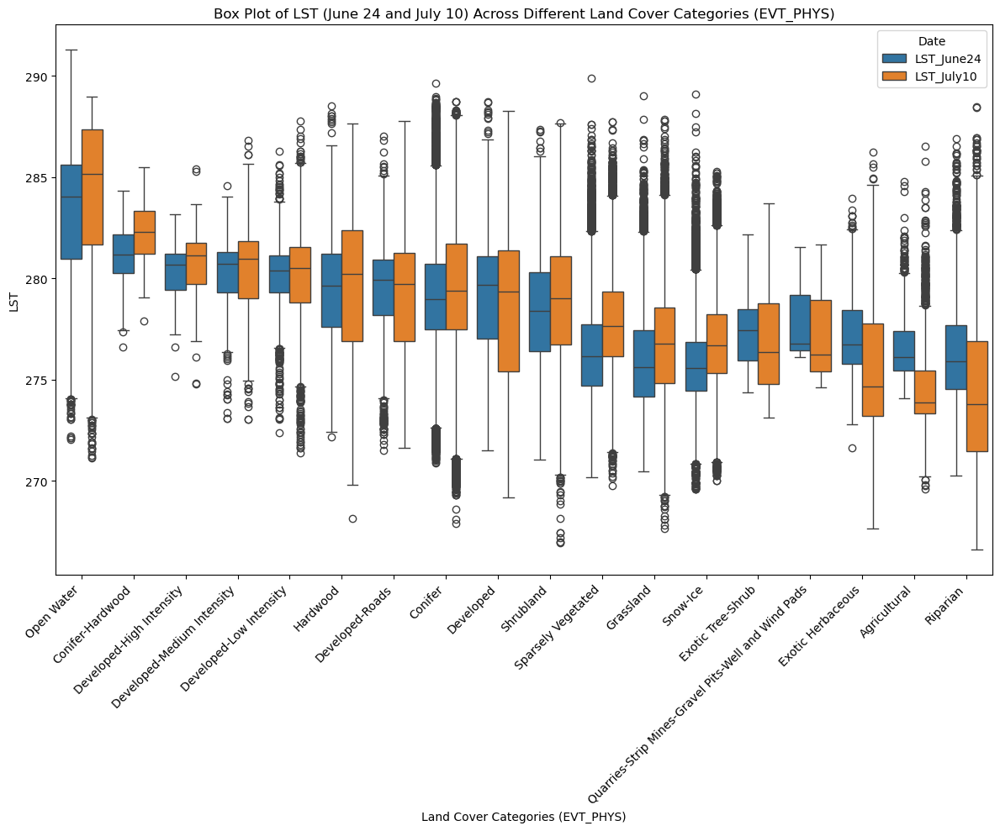

In [230]:
# Melt the DataFrame to long format
stack_melted = stack_df.melt(id_vars=['EVT_PHYS'], value_vars=['LST_June24', 'LST_July10'],
                             var_name='Date', value_name='LST')

# Calculate the median LST for each land cover category for July 10 for sorting
median_lst_july = stack_df.groupby('EVT_PHYS')['LST_July10'].median().sort_values(ascending=False)

# Create a box plot using the sorted categories
plt.figure(figsize=(12, 10))
sns.boxplot(x='EVT_PHYS', y='LST', hue='Date', data=stack_melted, order=median_lst_july.index)

# Rotate the x-axis labels for better readability if there are many categories
plt.xticks(rotation=45, ha='right')

# Add title and labels
plt.title('Box Plot of LST (June 24 and July 10) Across Different Land Cover Categories (EVT_PHYS)')
plt.xlabel('Land Cover Categories (EVT_PHYS)')
plt.ylabel('LST')

# Show the plot
plt.tight_layout()
plt.show()

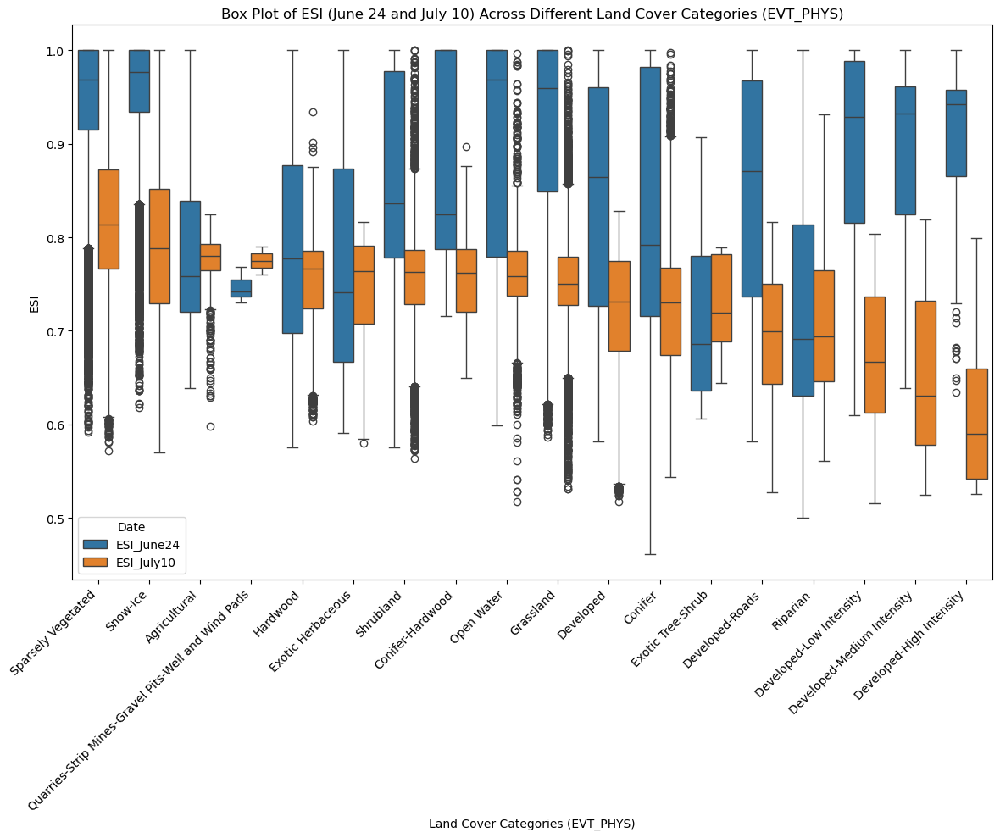

In [231]:
# Melt the DataFrame to long format
stack_melted = stack_df.melt(id_vars=['EVT_PHYS'], value_vars=['ESI_June24', 'ESI_July10'],
                             var_name='Date', value_name='ESI')

# Calculate the median LST for each land cover category for July 10 for sorting
median_esi_july = stack_df.groupby('EVT_PHYS')['ESI_July10'].median().sort_values(ascending=False)

# Create a box plot using the sorted categories
plt.figure(figsize=(12, 10))
sns.boxplot(x='EVT_PHYS', y='ESI', hue='Date', data=stack_melted, order=median_esi_july.index)

# Rotate the x-axis labels for better readability if there are many categories
plt.xticks(rotation=45, ha='right')

# Add title and labels
plt.title('Box Plot of ESI (June 24 and July 10) Across Different Land Cover Categories (EVT_PHYS)')
plt.xlabel('Land Cover Categories (EVT_PHYS)')
plt.ylabel('ESI')

# Show the plot
plt.tight_layout()
plt.show()

### Is there a correlation between LST or ESI and Energy Release Component (ERC)

Energy Release Component (ERC) is a number related to the available energy (BTU) per unit area (square foot) within the flaming front at the head of a fire. Daily variations in ERC are due to changes in moisture content of the various fuels present, both live and dead. It also provides some indication of the risk for crown fire initiation (and linked to extreme fire behavior). 

In the section below, we compare ECOSTRESS LST and ESI to ERC estimates from the same day. For this exercise, we retrieve ERC from GRIDMET (https://www.climatologylab.org/gridmet.html) using the Climate Engine tool. This tool can be used to access a variety of climate and meteorological datasets: https://app.climateengine.org/climateEngine (there is also a Python API to explore!)

GRIDMET data is at a coarse spatial resolution of 4-km. 

As a test, we will collect a random sample of points across the study region and test the relationships between LST/ESI and ERC. 

In [232]:
### Load the GRIDMET VPD for the days of our ECOSTRESS images
ercJuly_path = os.path.join(dest,'GRIDMET_ERC_June24.tif')
ercJuly = rxr.open_rasterio(ercJuly_path, masked=True).squeeze()
ercJuly = ercJuly.rio.clip_box(*bounds) # clip to our ROI
ercJuly = ercJuly.rio.reproject_match(eco_da[1])

# Plot it
ercJuly.hvplot.image(
    geo=True, tiles='ESRI', 
    aspect = 'equal', frame_width=300).opts(title="GRIDMET VPD July 10")

:Overlay
   .WMTS.I  :WMTS   [Longitude,Latitude]
   .Image.I :Image   [x,y]   (value)

In [233]:
# Generate random samples within the bounds of ECOSTRESS
transform = eco_da[2].rio.transform()

num_samples = 1000
rows, cols = eco_da[2].shape
random_pixels = np.column_stack((
    np.random.randint(0, rows, num_samples),
    np.random.randint(0, cols, num_samples)
))

# Convert pixel coordinates to geographic coordinates
lon, lat = rio.transform.xy(transform, random_pixels[:, 0], random_pixels[:, 1], offset='center')

# Create a list of points with their geographic coordinates
points = [{'Latitude': y, 'Longitude': x} for x, y in zip(lon, lat)]

# Convert to DataFrame
samples_df = pd.DataFrame(points).reset_index()

# Display the DataFrame
print(samples_df.head())

   index   Latitude   Longitude
0      0  40.390397 -105.776891
1      1  40.346300 -105.827917
2      2  40.498750 -105.582234
3      3  40.358269 -105.869494
4      4  40.353860 -105.800199


In [234]:
# Plot the EMIT data (just select one band by its wavelength)
eco_plot = eco_da[1].hvplot.image(
    cmap='greys',
    frame_height=300,
    frame_width=300,
    geo=True,
    crs='EPSG:4326'
).opts(title="Random Samples")

# Plot the sample points
points_plot = samples_df.hvplot.points(
    x='Longitude',
    y='Latitude',
    geo=True,
    crs='EPSG:4326',
    size=10
)

# Combine the plots
combined_plot = eco_plot * points_plot
combined_plot

:Overlay
   .Image.I  :Image   [x,y]   (value)
   .Points.I :Points   [Longitude,Latitude]

Now we can create a dataset to sample our random points. Creating a dataset here using 'xarray' is similar to our array stack earlier, only it does not require that the arrays have the same dimensions. This is useful when bringing together data arrays with different spatial resolutions like our ECOSTRESS and GRIDMET data.

In [235]:
# Setup the samples array to extract EMIT spectra
samples = samples_df.set_index(['index'])
xp = samples.to_xarray()
xp

<xarray.Dataset>
Dimensions:    (index: 1000)
Coordinates:
  * index      (index) int64 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
Data variables:
    Latitude   (index) float64 40.39 40.35 40.5 40.36 ... 40.51 40.52 40.19
    Longitude  (index) float64 -105.8 -105.8 -105.6 ... -105.6 -105.6 -105.7

In [238]:
### Create our sample Dataset
ds_stack = xr.Dataset({
    'ESI_July10': eco_da[1],
    'LST_July10': eco_da[3],
    'ERC': ercJuly
})
print(ds_stack)

# Sample GRIDMET values at the random points
extracted = ds_stack.sel(
    y=xp['Latitude'], x=xp['Longitude'], method='nearest'
).to_dataframe().reset_index()

# Merge the results
extracted.head()

<xarray.Dataset>
Dimensions:      (x: 666, y: 628)
Coordinates:
    band         int64 1
    spatial_ref  int64 0
  * x            (x) float64 -105.9 -105.9 -105.9 ... -105.5 -105.5 -105.5
  * y            (y) float64 40.55 40.55 40.55 40.55 ... 40.16 40.16 40.16 40.16
Data variables:
    ESI_July10   (y, x) float32 0.7079 0.7079 0.7189 ... 0.716 0.7175 0.7176
    LST_July10   (y, x) float64 275.1 275.1 275.4 275.9 ... 283.7 284.1 284.1
    ERC          (y, x) float32 52.0 52.67 52.67 52.67 ... 48.33 51.0 51.0 51.0


,index,band,spatial_ref,x,y,ESI_July10,LST_July10,ERC
0,0,1,0,-105.776891,40.390397,0.746372,276.40,46.333332
1,1,1,0,-105.827917,40.346300,0.670693,278.58,52.666668
2,2,1,0,-105.582234,40.498750,0.746475,279.10,38.000000
3,3,1,0,-105.869494,40.358269,0.626434,276.52,56.000000
4,4,1,0,-105.800199,40.353860,0.716906,276.02,52.666668


Pearson correlation coefficient: -0.34844607768199365
P-value: 6.386053740165198e-30


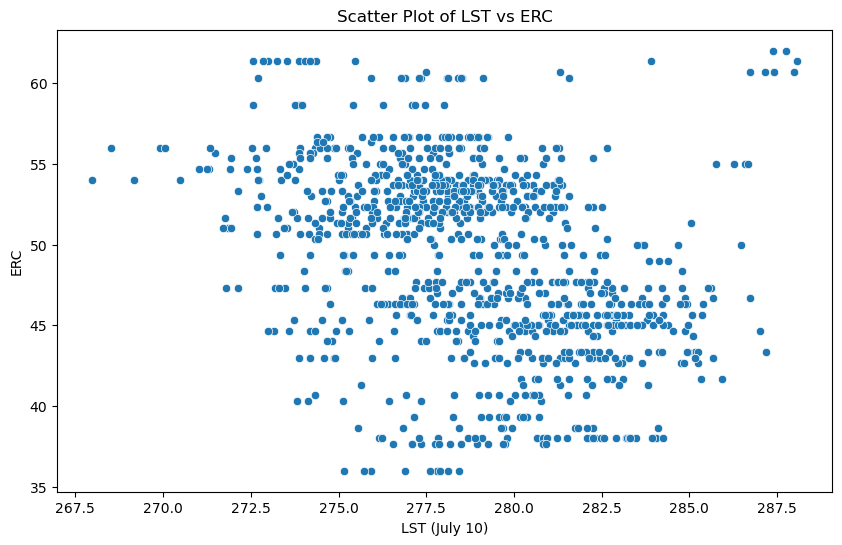

In [239]:
# Calculate the correlation between LST and ERC
correlation, p_value = pearsonr(extracted['LST_July10'], extracted['ERC'])
print(f'Pearson correlation coefficient: {correlation}')
print(f'P-value: {p_value}')

# Plot the relationship between LST and ERC
plt.figure(figsize=(10, 6))
sns.scatterplot(data=extracted, x='LST_July10', y='ERC')
plt.title('Scatter Plot of LST vs ERC')
plt.xlabel('LST (July 10)')
plt.ylabel('ERC')
plt.show()

Interestingly, this indicates a moderately weak negative correlation meaning that as LST increases, ERC decreases, although this relationship is not very strong. Let's also test the relationship with ESI below.


Pearson correlation coefficient: -0.34533206942974076
P-value: 1.0866853544544684e-28


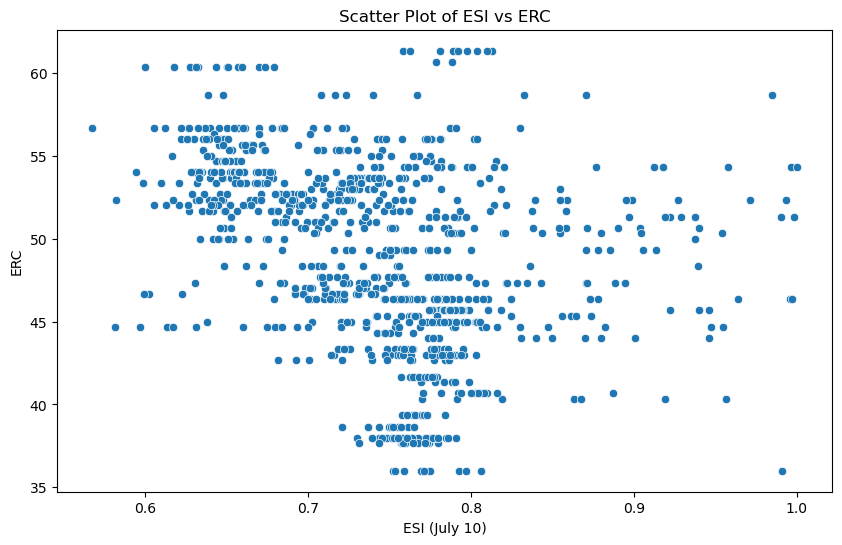

In [240]:
# Calculate the correlation between LST and ERC
extracted_na = extracted.dropna()
correlation, p_value = pearsonr(extracted_na['ESI_July10'], extracted_na['ERC'])
print(f'Pearson correlation coefficient: {correlation}')
print(f'P-value: {p_value}')

# Plot the relationship between LST and ERC
plt.figure(figsize=(10, 6))
sns.scatterplot(data=extracted_na, x='ESI_July10', y='ERC')
plt.title('Scatter Plot of ESI vs ERC')
plt.xlabel('ESI (July 10)')
plt.ylabel('ERC')
plt.show()

Again, we se a moderate to weak negative correlation between ESI and ERC. However, this seems to make some sense. Higher evaporative stress may be correlated with fuel moisture and thus ERC. A next step here might be look at this relationship across different landcover types to see if vegetation/fuel type influences the strength of this relationship.

#### CHALLENGE: Create a new dataset like above, including the landcover data. Test the relationships across different landcover types

#### CHALLENGE: Find and download an LST image during one of the wildfires in 2020 to see if we can capture hotspots or smoke plumes